In [16]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        os.path.join(dirname, filename)

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [17]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, random_split, Dataset
from torchvision import transforms
from torchvision.utils import save_image
from PIL import Image
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [18]:
class SARTOOpticalDataset(Dataset):
    def __init__(self, sar_dir, optical_dir, sar_transform=None, optical_transform=None):
        self.sar_dir = sar_dir
        self.optical_dir = optical_dir
        self.sar_images = os.listdir(sar_dir)
        self.optical_images = os.listdir(optical_dir)
        self.sar_transform = sar_transform
        self.optical_transform = optical_transform

    def __len__(self):
        return len(self.sar_images)

    def __getitem__(self, index):
        sar_img_path = os.path.join(self.sar_dir, self.sar_images[index])
        optical_img_path = os.path.join(self.optical_dir, self.optical_images[index])

        sar_image = Image.open(sar_img_path).convert("L")
        optical_image = Image.open(optical_img_path).convert("RGB")

        if self.sar_transform:
            sar_image = self.sar_transform(sar_image)
        if self.optical_transform:
            optical_image = self.optical_transform(optical_image)

        return sar_image, optical_image

In [19]:
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5])  # For SAR images (grayscale)
])

optical_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # For Optical images (RGB)
])

In [28]:
dataset = SARTOOpticalDataset(
    sar_dir=r'D:\hackathon\training\s1',
    optical_dir=r"D:\hackathon\training\s2",
    sar_transform=transform,
    optical_transform=optical_transform
)

train_size = int(0.8 * len(dataset))
test_size = len(dataset) - train_size
train_dataset, test_dataset = random_split(dataset, [train_size, test_size])

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

In [29]:
class UNetGenerator(nn.Module):
    def __init__(self):
        super(UNetGenerator, self).__init__()
        self.encoder = nn.Sequential(
            self._block(1, 64, 4, 2, 1),
            self._block(64, 128, 4, 2, 1),
            self._block(128, 256, 4, 2, 1),
            self._block(256, 512, 4, 2, 1),
            self._block(512, 512, 4, 2, 1),
        )
        
        self.decoder = nn.Sequential(
            self._upblock(512, 512, 4, 2, 1),
            self._upblock(512, 256, 4, 2, 1),
            self._upblock(256, 128, 4, 2, 1),
            self._upblock(128, 64, 4, 2, 1),
            nn.ConvTranspose2d(64, 3, 4, 2, 1),
            nn.Tanh()
        )
    
    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2)
        )
    
    def _upblock(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding),
            nn.BatchNorm2d(out_channels),
            nn.ReLU()
        )
    
    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

In [30]:
class PatchGANDiscriminator(nn.Module):
    def __init__(self):
        super(PatchGANDiscriminator, self).__init__()
        self.model = nn.Sequential(
            self._block(4, 64, 4, 2, 1, False),
            self._block(64, 128, 4, 2, 1),
            self._block(128, 256, 4, 2, 1),
            self._block(256, 512, 4, 1, 1),
            nn.Conv2d(512, 1, 4, 1, 1)
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding, normalize=True):
        layers = [nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding)]
        if normalize:
            layers.append(nn.BatchNorm2d(out_channels))
        layers.append(nn.LeakyReLU(0.2))
        return nn.Sequential(*layers)

    def forward(self, sar_image, optical_image):
        x = torch.cat((sar_image, optical_image), dim=1)
        return self.model(x)

In [31]:
    generator = UNetGenerator().to(device)
discriminator = PatchGANDiscriminator().to(device)

In [32]:
criterion_GAN = nn.BCELoss()
criterion_L1 = nn.L1Loss()

optimizer_G = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

In [33]:
def visualize_results(sar, generated_optical, real_optical, epoch, step):
    def denormalize(img):
        img = img * 0.5 + 0.5
        return img.clamp(0, 1)
    
    # Detach from the computational graph and move to CPU before converting to numpy
    sar = denormalize(sar).cpu().detach().numpy().transpose(1, 2, 0)
    generated_optical = denormalize(generated_optical).cpu().detach().numpy().transpose(1, 2, 0)
    real_optical = denormalize(real_optical).cpu().detach().numpy().transpose(1, 2, 0)

    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs[0].imshow(sar.squeeze(), cmap='gray')
    axs[0].set_title('SAR Image')
    axs[0].axis('off')

    axs[1].imshow(generated_optical)
    axs[1].set_title('Generated Optical Image')
    axs[1].axis('off')

    axs[2].imshow(real_optical)
    axs[2].set_title('Real Optical Image')
    axs[2].axis('off')

    plt.suptitle(f'Epoch: {epoch}, Step: {step}', fontsize=16)
    plt.show()

Epoch [0/50], Step [0/20], D Loss: 1.6682, G Loss: 45.2575


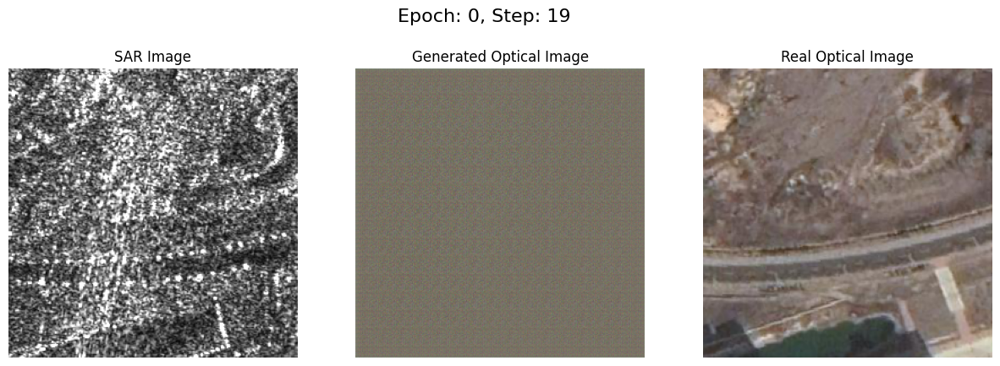

Epoch [1/50], Step [0/20], D Loss: 1.0697, G Loss: 35.0408
Epoch [2/50], Step [0/20], D Loss: 0.7138, G Loss: 26.9342
Epoch [3/50], Step [0/20], D Loss: 0.3354, G Loss: 26.1053
Epoch [4/50], Step [0/20], D Loss: 0.3964, G Loss: 25.8050
Epoch [5/50], Step [0/20], D Loss: 0.3575, G Loss: 21.2336


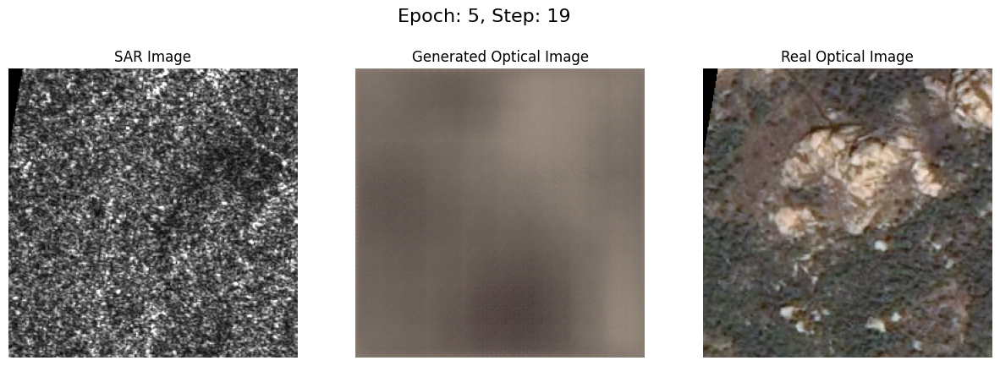

Epoch [6/50], Step [0/20], D Loss: 0.2138, G Loss: 25.1491
Epoch [7/50], Step [0/20], D Loss: 0.2505, G Loss: 22.7033
Epoch [8/50], Step [0/20], D Loss: 0.1729, G Loss: 20.8837
Epoch [9/50], Step [0/20], D Loss: 0.1511, G Loss: 19.8067
Epoch [10/50], Step [0/20], D Loss: 0.2155, G Loss: 19.3535


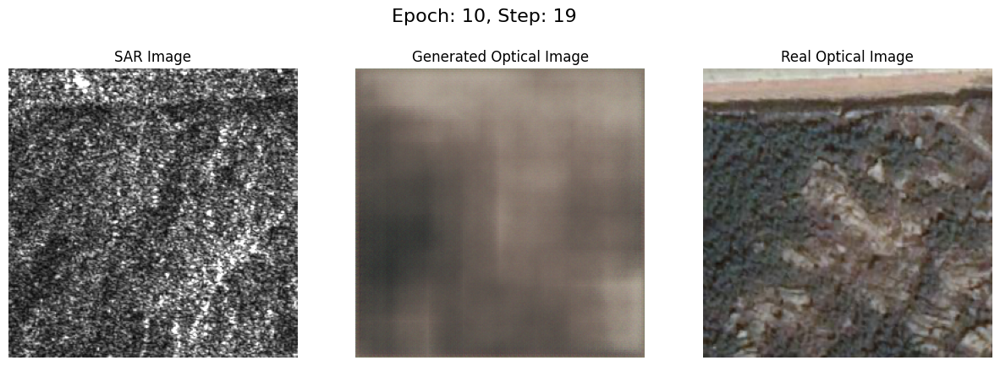

Epoch [11/50], Step [0/20], D Loss: 0.2765, G Loss: 18.1129
Epoch [12/50], Step [0/20], D Loss: 0.1280, G Loss: 15.4877
Epoch [13/50], Step [0/20], D Loss: 0.1615, G Loss: 17.0049
Epoch [14/50], Step [0/20], D Loss: 0.3849, G Loss: 15.9191
Epoch [15/50], Step [0/20], D Loss: 0.2708, G Loss: 15.9831


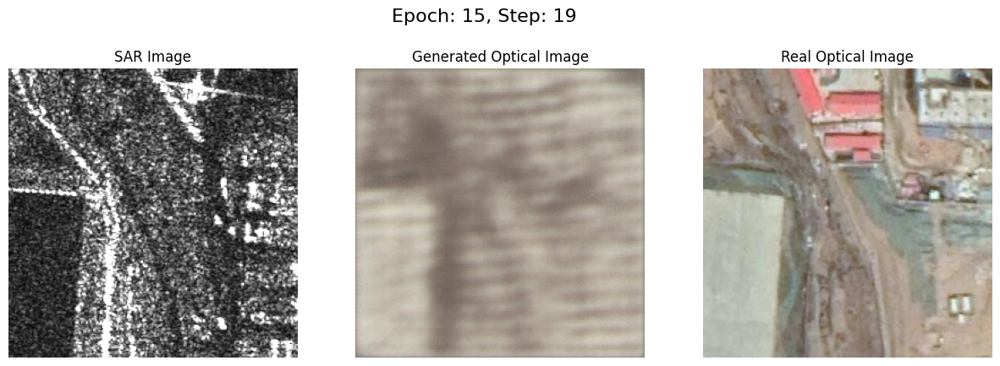

Epoch [16/50], Step [0/20], D Loss: 0.1708, G Loss: 14.3556
Epoch [17/50], Step [0/20], D Loss: 0.1751, G Loss: 13.0230
Epoch [18/50], Step [0/20], D Loss: 0.1204, G Loss: 12.3718
Epoch [19/50], Step [0/20], D Loss: 0.1162, G Loss: 11.2674
Epoch [20/50], Step [0/20], D Loss: 0.1106, G Loss: 12.2722


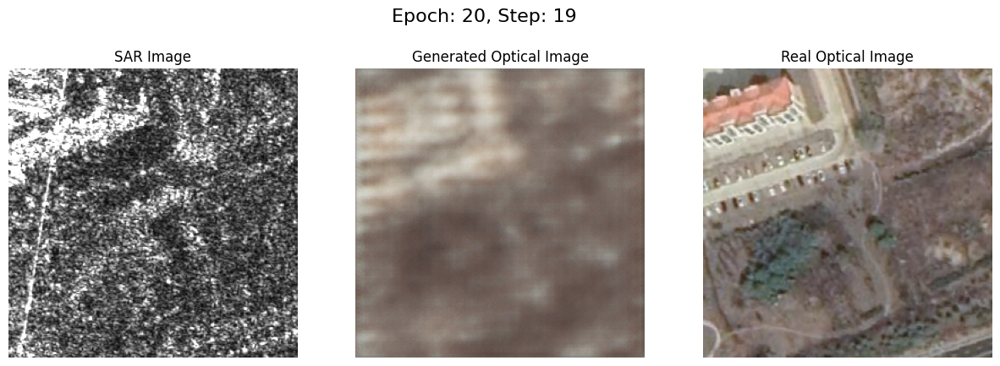

Epoch [21/50], Step [0/20], D Loss: 0.0844, G Loss: 11.8159
Epoch [22/50], Step [0/20], D Loss: 0.2071, G Loss: 13.8852
Epoch [23/50], Step [0/20], D Loss: 0.0950, G Loss: 12.4951
Epoch [24/50], Step [0/20], D Loss: 0.1539, G Loss: 10.8743
Epoch [25/50], Step [0/20], D Loss: 0.1968, G Loss: 11.3793


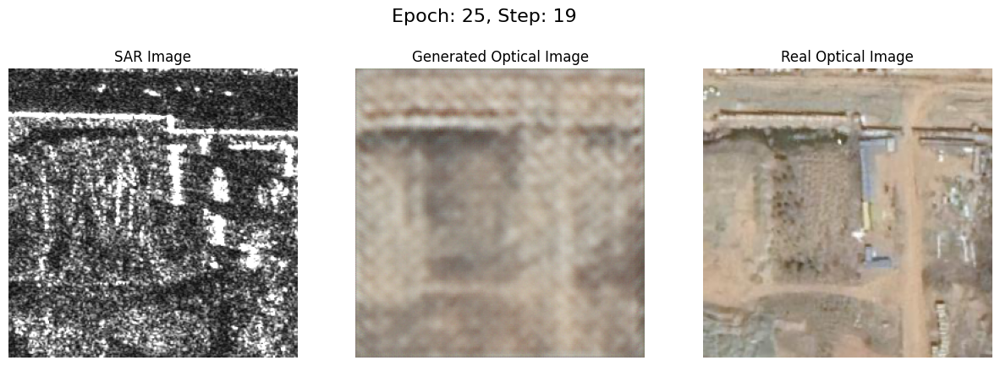

Epoch [26/50], Step [0/20], D Loss: 0.1627, G Loss: 10.7642
Epoch [27/50], Step [0/20], D Loss: 0.0888, G Loss: 11.4406
Epoch [28/50], Step [0/20], D Loss: 0.0749, G Loss: 12.8451
Epoch [29/50], Step [0/20], D Loss: 0.1062, G Loss: 10.7483
Epoch [30/50], Step [0/20], D Loss: 0.1224, G Loss: 10.5268


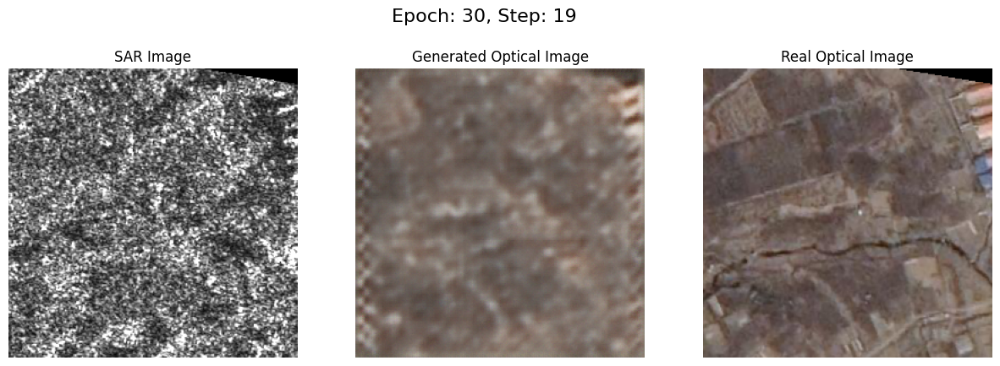

Epoch [31/50], Step [0/20], D Loss: 0.1737, G Loss: 11.8240
Epoch [32/50], Step [0/20], D Loss: 0.2726, G Loss: 11.0677
Epoch [33/50], Step [0/20], D Loss: 0.1461, G Loss: 11.6524
Epoch [34/50], Step [0/20], D Loss: 0.2552, G Loss: 12.6416
Epoch [35/50], Step [0/20], D Loss: 0.0905, G Loss: 10.2332


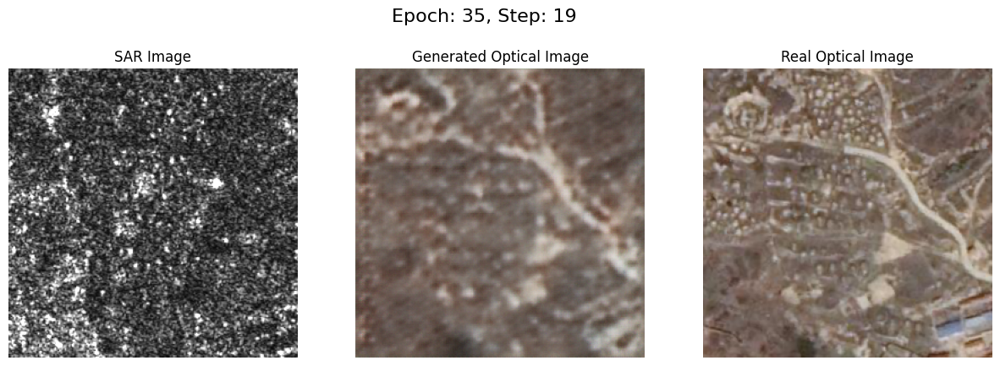

Epoch [36/50], Step [0/20], D Loss: 0.1312, G Loss: 11.2870
Epoch [37/50], Step [0/20], D Loss: 0.1926, G Loss: 11.8553
Epoch [38/50], Step [0/20], D Loss: 0.3959, G Loss: 10.9284
Epoch [39/50], Step [0/20], D Loss: 0.0867, G Loss: 10.8274
Epoch [40/50], Step [0/20], D Loss: 0.3562, G Loss: 12.1352


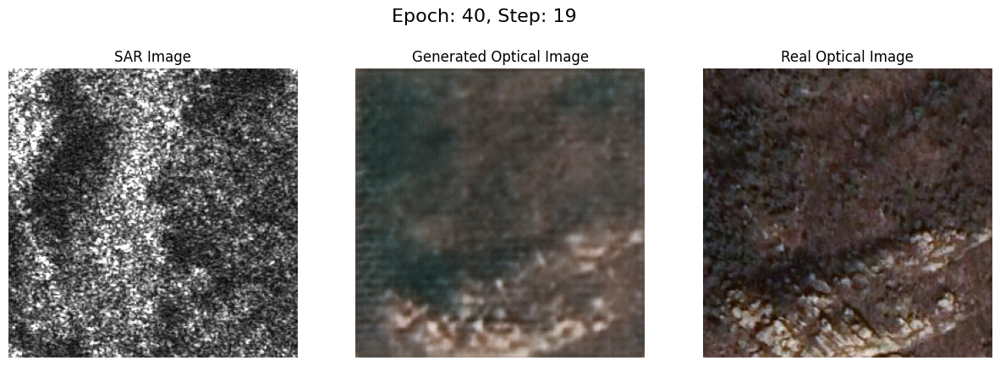

Epoch [41/50], Step [0/20], D Loss: 0.1636, G Loss: 9.7624
Epoch [42/50], Step [0/20], D Loss: 0.2200, G Loss: 10.9538
Epoch [43/50], Step [0/20], D Loss: 0.0923, G Loss: 8.7586
Epoch [44/50], Step [0/20], D Loss: 0.3047, G Loss: 16.3768
Epoch [45/50], Step [0/20], D Loss: 0.1797, G Loss: 10.8039


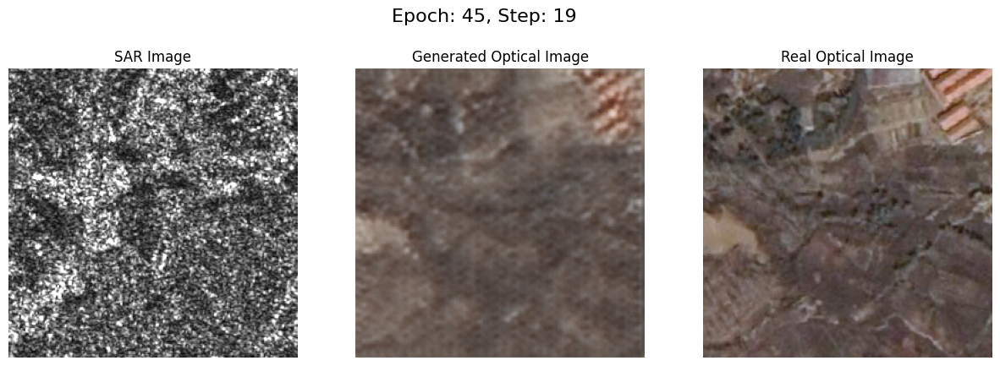

Epoch [46/50], Step [0/20], D Loss: 0.2341, G Loss: 8.9886
Epoch [47/50], Step [0/20], D Loss: 0.2057, G Loss: 10.2016
Epoch [48/50], Step [0/20], D Loss: 0.1744, G Loss: 10.2791
Epoch [49/50], Step [0/20], D Loss: 0.2455, G Loss: 8.7436


In [34]:
def weights_init_normal(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm2d') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0.0)

generator = UNetGenerator().to(device)
discriminator = PatchGANDiscriminator().to(device)

generator.apply(weights_init_normal)
discriminator.apply(weights_init_normal)

# Loss functions
criterion_GAN = nn.MSELoss()  # Adversarial loss
criterion_L1 = nn.L1Loss()  # L1 loss for pixel-wise difference

# Optimizers
optimizer_G = optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_D = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

num_epochs = 50
g_losses = []
d_losses = []

for epoch in range(num_epochs):
    for i, (sar, optical) in enumerate(train_loader):
        sar = sar.to(device)
        optical = optical.to(device)

        # Train Discriminator
        optimizer_D.zero_grad()

        real_labels = torch.ones(optical.size(0), 1, 30, 30).to(device)
        fake_labels = torch.zeros(optical.size(0), 1, 30, 30).to(device)

        real_output = discriminator(sar, optical)
        d_loss_real = criterion_GAN(real_output, real_labels)

        fake_optical = generator(sar)
        fake_output = discriminator(sar, fake_optical.detach())
        d_loss_fake = criterion_GAN(fake_output, fake_labels)

        d_loss = (d_loss_real + d_loss_fake) / 2
        d_loss.backward()
        optimizer_D.step()

        # Train Generator
        optimizer_G.zero_grad()

        fake_output = discriminator(sar, fake_optical)
        g_loss_GAN = criterion_GAN(fake_output, real_labels)
        g_loss_L1 = criterion_L1(fake_optical, optical) * 100

        g_loss = g_loss_GAN + g_loss_L1
        g_loss.backward()
        optimizer_G.step()
        
        g_losses.append(g_loss.item())
        d_losses.append(d_loss.item())
        
        if i % 100 == 0:
            print(f"Epoch [{epoch}/{num_epochs}], Step [{i}/{len(train_loader)}], "
                  f"D Loss: {d_loss.item():.4f}, G Loss: {g_loss.item():.4f}")
            
    if epoch % 5 == 0:
        visualize_results(sar[0], fake_optical[0], optical[0], epoch, i)

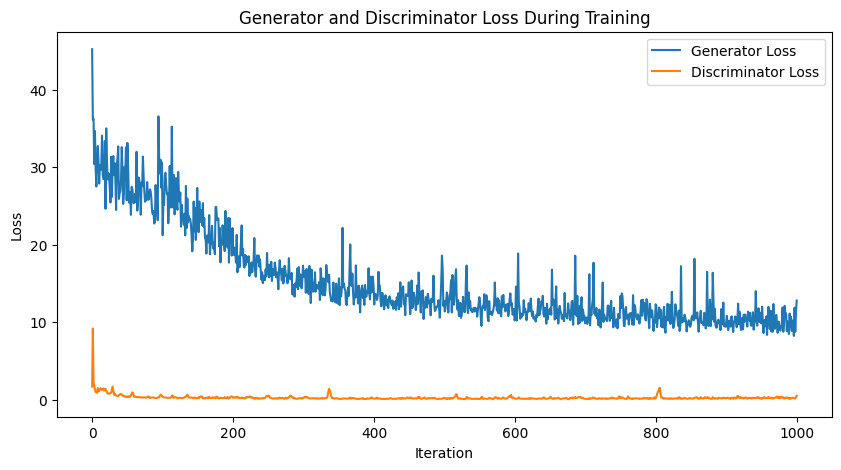

In [35]:
plt.figure(figsize=(10, 5))
plt.plot(g_losses, label='Generator Loss')
plt.plot(d_losses, label='Discriminator Loss')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.title('Generator and Discriminator Loss During Training')
plt.legend()
plt.show()

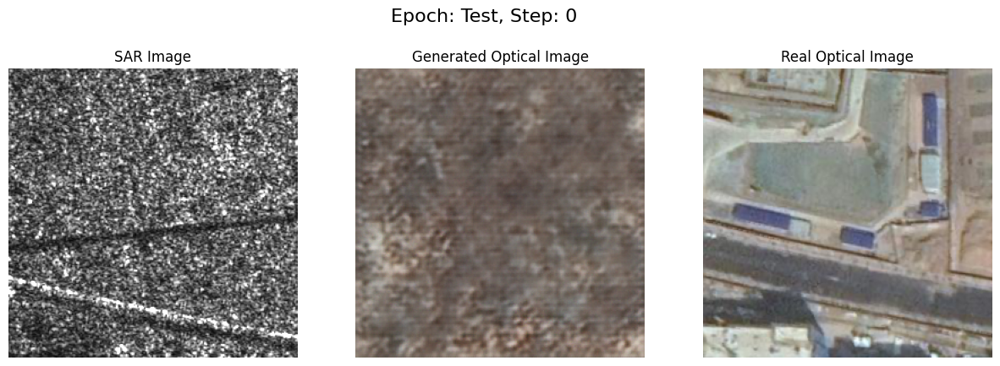

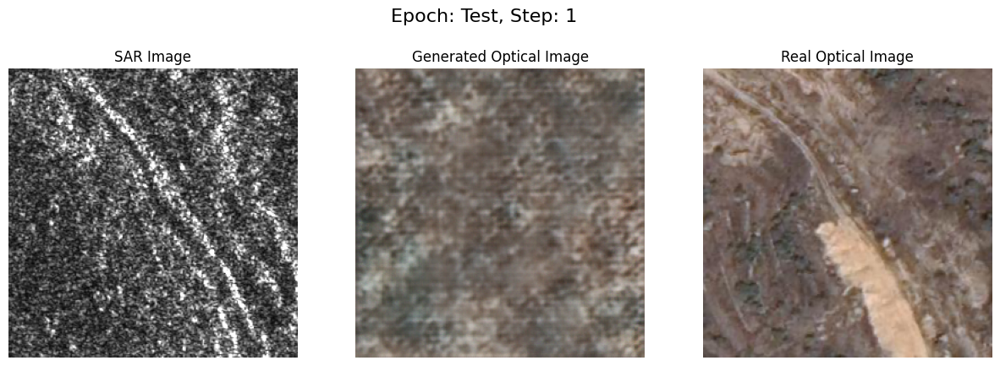

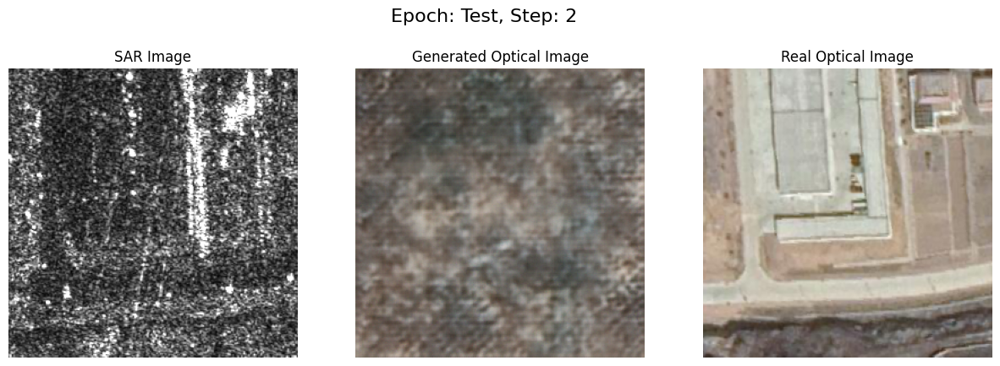

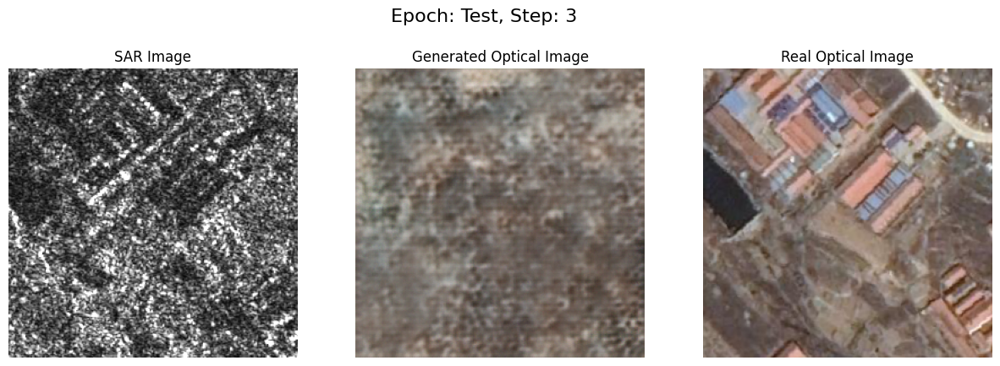

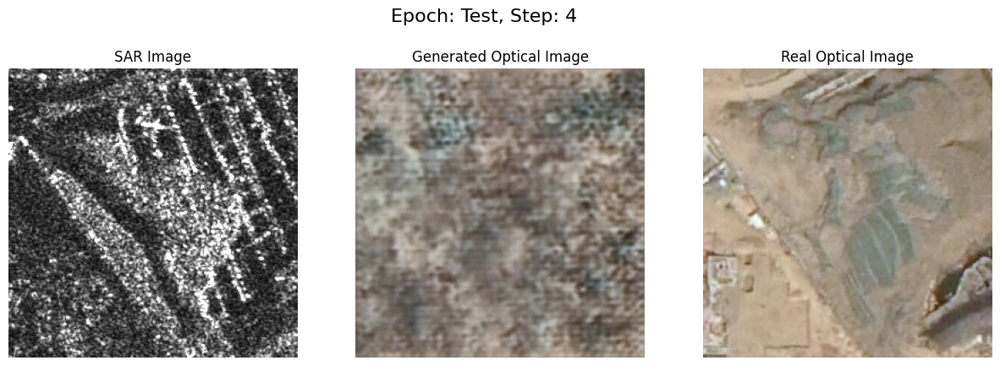

...

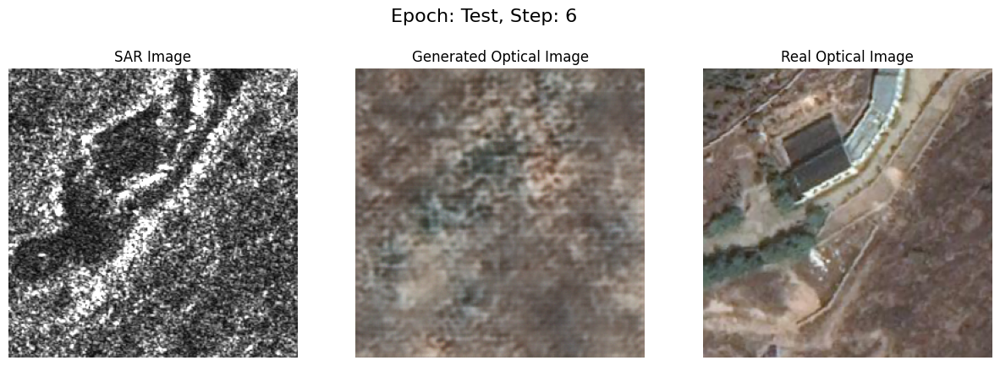

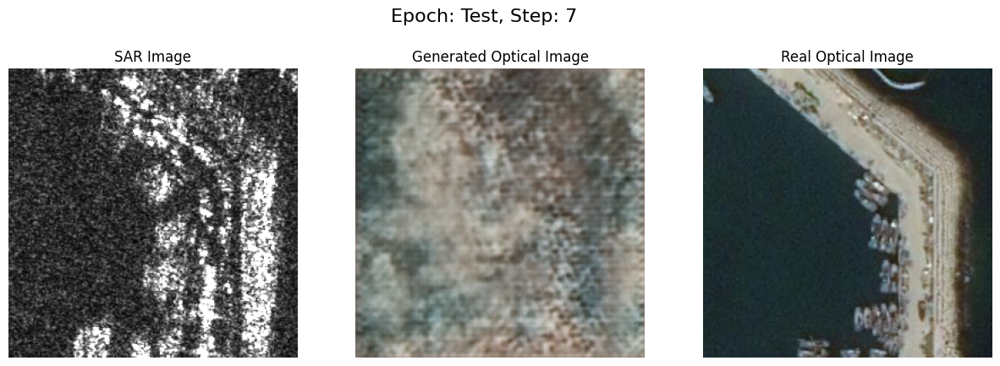

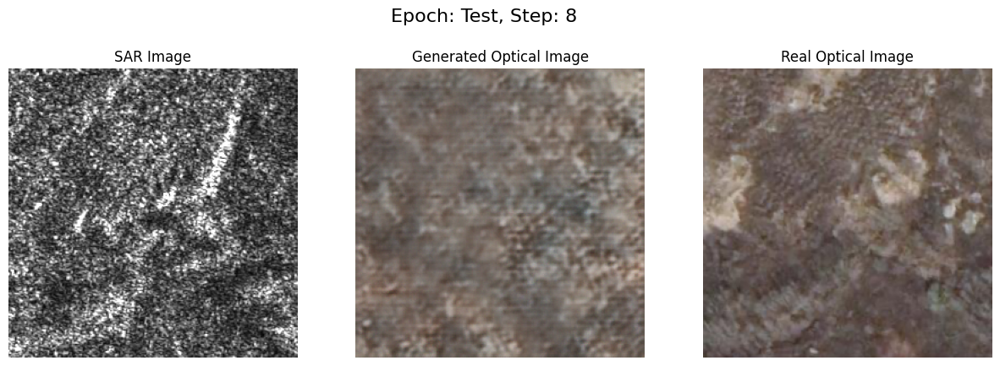

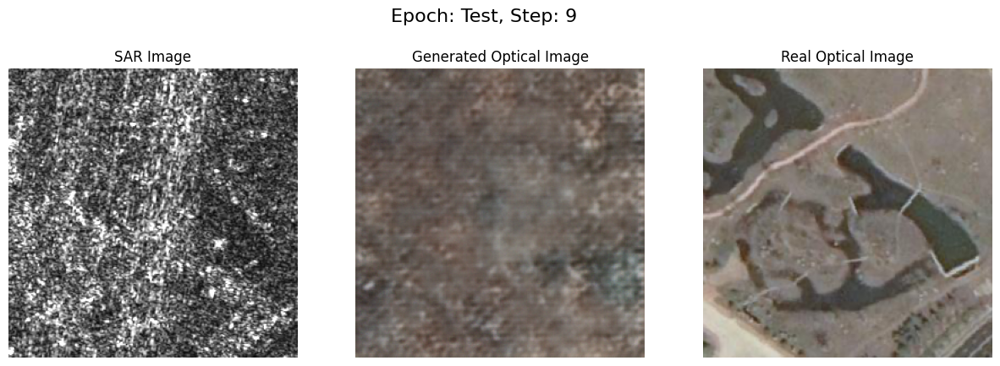

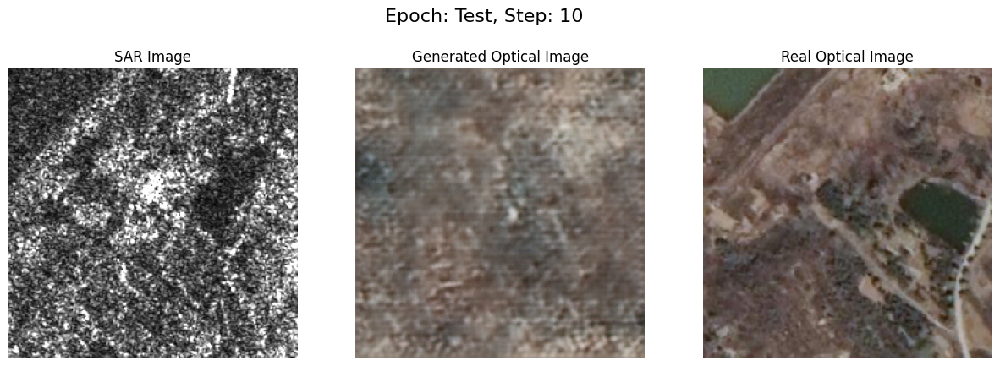

Average PSNR: 15.5761


In [36]:
generator.eval()  # Set generator to evaluation mode

psnr_values = []
ssim_values = []

with torch.no_grad():
    for i, (sar, optical) in enumerate(test_loader):
        sar = sar.to(device)
        optical = optical.to(device)

        generated_optical = generator(sar)

        real_img = optical[0].cpu().numpy().transpose(1, 2, 0)
        gen_img = generated_optical[0].cpu().numpy().transpose(1, 2, 0)

        psnr_value = psnr(real_img, gen_img)
#         ssim_value = ssim(real_img, gen_img, multichannel=True)

        psnr_values.append(psnr_value)
#         ssim_values.append(ssim_value)

        if i<=10:
          visualize_results(sar[0], generated_optical[0], optical[0], epoch="Test", step=i)

avg_psnr = sum(psnr_values) / len(psnr_values)
# avg_ssim = sum(ssim_values) / len(ssim_values)

print(f'Average PSNR: {avg_psnr:.4f}')

In [37]:
# Save models
torch.save(generator.state_dict(), "generator.pth")
torch.save(discriminator.state_dict(), "discriminator.pth")